<a href="https://colab.research.google.com/github/FrancescoMorri/Simple-Evolution/blob/main/Main%26Data_Visualization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Simple Evolution Simulation
This notebook models, in a very simple and straightforward way, genetic selection during evolution.

First, we import all the libraries needed for the simulation.

In [45]:
#This is only for colab, the simulation works without it otherwise
from matplotlib import rc
rc('animation', html='jshtml')

In [46]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.patches as patches
import matplotlib

import random
import numpy as np

## Blob Class
Here we define the entities that will evolve.<br>
Each Blob has a certain `speed`, `vision` and `life`. It needs to eat at least one food for round (it is editable). If, after `LIFE` steps the Blob hasn't found food, it dies.<br>
If it finds more than a given amount of food (we check using the variable `fed`), it can reproduce.<br>
In that case the offspring inherits the `VISION`, `SPEED` and `LIFE` of the parent, with a random possible mutation.<br>
Each Blob moves randomly and they all live on a toroid.<br><br>
Each method is explained with comments in the code.<br>
All the main variables that define the behaviour of the Blob can be changed in this class.

In [47]:
class Blob(object):

    VISION = 0.1 # starting vision
    SPEED = 0.08 # starting speed
    LIFE = 13 # starting life

    color = 'cyan'
    fed = 0  # will became true if it is fed
    steps = 0  # when it is == 9 the blob has finished its energy
    mov_prob = [0, 0, 0, 0]  # the prob with which the blob moves
    vision = 0

    def __init__(self, x, y, radius, heir=False, vis=0.1, spe=0.05, old_life=12):
        """
        Initialization of the blob:
        x = position x
        y = position y
        radius = radius
        It randomizes the probabilities of moving.
        If it is not the first generation the newborn will have a VISION and SPEED possibly different from the parent.
        """
        # self.generation = gen
        self.x = x
        self.y = y
        self.r = radius

        if heir:  # change in the heritage
            self.VISION = vis
            self.SPEED = spe

            # Change in SPEED
            p = random.randint(0, 100)
            if (p < 75):
                pass
            else:
                gen = float(random.randint(-250, 250)/10000.)  # 50% of the basic speed
                new_speed = self.SPEED + gen
                new_speed = max(0.0001, new_speed)
                self.SPEED = min(new_speed, 0.3)

            # Change in VISION
            p = random.randint(0, 100)
            if (p < 75):
                pass
            else:
                gen = float(random.randint(-500, 500)/10000.)  # 50% of the basic vision
                new_vision = self.VISION + gen
                new_vision = max(0.001, new_vision)
                self.VISION = min(new_vision, 0.6)

        # Moving Probabilities normalized
        for i in range(len(self.mov_prob)):
            self.mov_prob[i] = float(random.randint(0, 100)/100)
        s = sum(self.mov_prob)
        for i in range(len(self.mov_prob)):
            self.mov_prob[i] /= s

        # Life Calculator
        '''
        if (self.SPEED - spe > 0.005):
            self.LIFE = old_life - 1
        elif (self.SPEED - spe < -0.005):
            self.LIFE = old_life + 1

        if (self.VISION - vis > 0.025):
            self.LIFE = old_life - 1
        elif (self.VISION - vis < -0.025):
            self.LIFE = old_life + 1
        '''
        self.LIFE = 16 - (int((self.SPEED * 100)/2) + int(self.VISION * 10))


    def move(self):
        '''
        It just move the blob using its probabilities.
        '''
        p = float(random.randint(0, 100)/100)
        m = 0.05
        if (p < self.mov_prob[0]):  # moving right
            nx = (self.x + m) % 4.
            ny = self.y
        elif (p > self.mov_prob[0] and p < (self.mov_prob[0] + self.mov_prob[1])):  # moving left
            nx = (self.x - m) % 4.
            ny = self.y
        elif (p > (self.mov_prob[0] + self.mov_prob[1]) and p < (self.mov_prob[0] + self.mov_prob[1] + self.mov_prob[2])):  # moving up
            nx = self.x
            ny = (self.y + m) % 4.
        else:  # moving down
            nx = self.x
            ny = (self.y - m) % 4.
        self.x = nx
        self.y = ny
        self.steps += 1

    def food_check(self, food_map):
        '''
        Check in a circle of radius VISION if there is any food, if there is it moves there, else it just use its basic motion.
        '''
        for f in food_map:
            d = np.sqrt(((f[0]-self.x)**2 + (f[1]-self.y)**2))
            if (d <= self.VISION):
                self.x = f[0]
                self.y = f[1]
                self.steps += 1
                self.fed += 1
                food_map.remove(f)
                return False
        return True

    def color_change(self):
        '''
        The color of the blobs depends on their attributes.
        '''
        r = np.interp(self.VISION, [0.01, 0.6], [0, 1])
        b = np.interp(self.SPEED, [0.0001, 0.2], [0, 1])
        g = 0.
        self.color = (r, g, b)


## Food Functions
This functions are used to generate the configuration of food at the beginning of the simulation. Every few cycles more food is added, and each of these functions can either return an array for the whole map ( `tp == 0`), or just coordinates (`tp == 1`).




In [51]:
def central_column(n_food, tp):
    '''
    tp = 0 -> Array
    tp = 1 -> coordinates
    '''
    if (tp == 0):
        foody = []
        for i in range(n_food):
            x = float(random.randint(100, 300)/100)
            y = float(random.randint(0, 400)/100)
            foody.append((x, y))
        return foody
    elif (tp == 1):
        x = float(random.randint(100, 300)/100)
        y = float(random.randint(0, 400)/100)
        return (x, y)


def islands(n_food, tp):
    '''
    tp = 0 -> Array
    tp = 1 -> coordinates
    '''
    if (tp == 0):   
        foody = []
        for i in range(int(n_food/2)):
            x = float(random.randint(0, 200)/100)
            y = float(random.randint(0, 200)/100)
            foody.append((x, y))
        for i in range(int(n_food/2)):
            x = float(random.randint(200, 400)/100)
            y = float(random.randint(200, 400)/100)
            foody.append((x, y))
        return foody
    elif (tp == 1):
        p = random.randint(0, 100)
        if (p <= 50):
            x = float(random.randint(0, 200)/100)
            y = float(random.randint(0, 200)/100)
        elif (p > 50):
            x = float(random.randint(200, 400)/100)
            y = float(random.randint(200, 400)/100)
        return (x, y)                       


def food_rand(n_food, tp):
    '''
    tp = 0 -> Array
    tp = 1 -> coordinates
    '''
    if (tp == 0):
        foody = []
        for i in range(n_food):
            x = float(random.randint(0, 400)/100)
            y = float(random.randint(0, 400)/100)
            foody.append((x, y))
        return foody
    elif (tp == 1):
        x = float(random.randint(0, 400)/100)
        y = float(random.randint(0, 400)/100)
        return (x, y)


## Animation Function
This function loops through all the alive Blobs and check what they can do (move, feed, reproduce). It shows both a map of the Blobs with the food and a graph reporting how the two gene (speed and velocity) are changing.<br>
It also save some data in the list `info` that later will be graphed as well.

In [52]:
def animate(i):
    global blobbi, food, info
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    data = []
    mean_life = 0
    ax1.clear()
    ax2.clear()
    ax1.set(xlim=(0, 4), ylim=(0, 4))
    ax2.set(xlim=(0.01, 0.6), ylim=(0.0001, 0.2))
    for f in food:
        square = patches.Rectangle(f, 0.018, 0.018, color='black')
        ax1.add_patch(square)

    for b in blobbi:
        b.color_change()
        mean_life += b.LIFE
        # if the blob is alive
        if (b.steps < b.LIFE):
            check = b.food_check(food)  # check for food near him
            if (check):
                b.move()  # if no food is found, next move
            circle = patches.Circle((b.x, b.y), b.r, color=b.color)
            ax1.add_patch(circle)
            #ax1.annotate(str(b.generation), xy=(b.x, b.y), fontsize=8, ha="center", va='center', color='black')

        # else, if the blob is death
        elif (b.steps >= b.LIFE):
            if (b.fed != 0):  # check if it has eaten
                b.fed = 0
                b.steps = 0
            else:  # else kill him
                blobbi.remove(b)

        # checking if the blob can make a babyblob
        if (b.fed >= 3):
            b.steps += 1  # maybe too harsh?
            b.fed = 0
            nx = b.x + float(random.randint(-50, 50)/100)
            ny = b.y + float(random.randint(-50, 50)/100)
            blobbi.append(Blob(nx, ny, 0.05, heir=True, vis=b.VISION, spe=b.SPEED, old_life=b.LIFE))
            continue

        data.append((b.VISION, b.SPEED, b.color[0], b.color[1], b.color[2]))

    if (len(blobbi) == 0):
        mean_life = 0
    else:
        mean_life /= len(blobbi)

    for f in range(REFRESH):
        food.append((food_rand(0, 1)))

    ax1.set_title('Step %.d (%.d blob left; %.d food left)' % (i, len(blobbi), len(food)))

    ax2.set_title('Population')
    ax2.set_xlabel('VISION')
    ax2.set_ylabel('SPEED')
    data_np = np.array(data)
    xs = data_np[:, 0]
    ys = data_np[:, 1]
    colors = [(d[2], d[3], d[4]) for d in data_np]
    V_x = [0.1, 0.1]
    V_y = [0, 3]
    S_x = [0, 3]
    S_y = [0.08, 0.08]
    ax2.grid()
    ax2.plot(V_x, V_y, color='black', alpha=0.5, label='Starting Vision')
    ax2.plot(S_x, S_y, color='black', alpha=0.5, label='Starting Speed')
    ax2.text(0.61, 0.83, "Mean Life: %.3f" % (mean_life), transform=ax2.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
    ax2.scatter(xs, ys, color=colors, label='blobs')
    ax2.legend()

    info.append((len(food), len(blobbi), np.mean(xs), np.mean(ys), mean_life))

## Initial Parameter
Always recompile these before starting a new simulation.

In [59]:
FOOD = 200
BLOBS = 50
REFRESH = 5

In [79]:
%%capture
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,8))

blobbi = []
food = []
info = []
for i in range(BLOBS):
    x = float(random.randint(0, 400)/100)
    y = float(random.randint(0, 400)/100)
    blobbi.append(Blob(x, y, 0.05))

food = food_rand(FOOD, tp=0)
counting = 0


## Animation
`anim` has all the info to animate the simulation.<br>
With `data` we save all the informations about the simulation in a *csv* file, to be graphed and/or downloaded.

In [80]:
anim = animation.FuncAnimation(fig, animate, interval=50, frames=100, blit=False, repeat=False)

In [83]:
anim.save('Bolbs.gif', writer = "pillow", fps=10 )

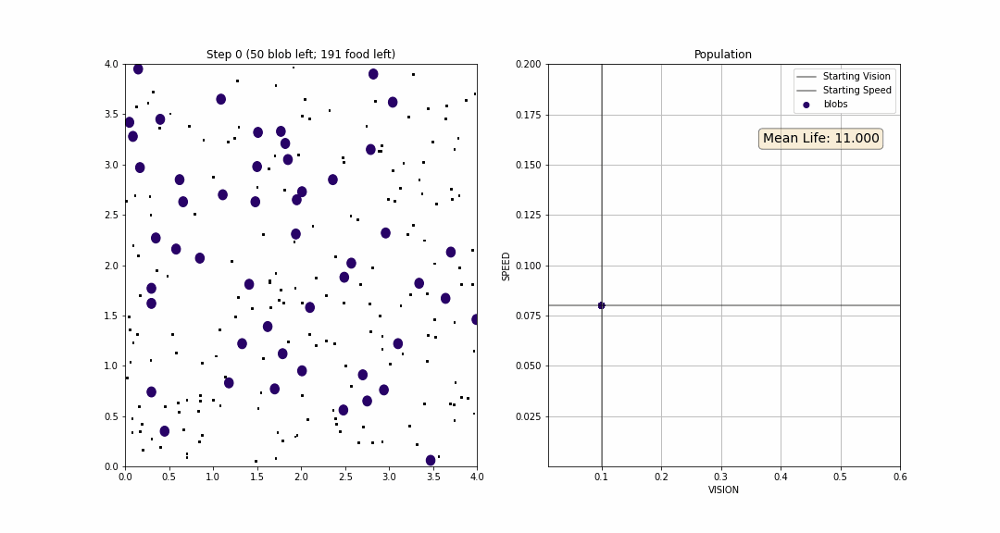

In [84]:
from IPython.display import Image
Image(open('Bolbs.gif','rb').read())

# Problems for Now

In [73]:
from matplotlib.gridspec import GridSpec

In [74]:
data = np.loadtxt("data.csv", delimiter=',')

food = data[:, 0]
population = data[:, 1]
mean_vis = data[:, 2]
mean_spe = data[:, 3]
mean_life = data[:, 4]

fig = plt.figure(figsize=(18,8))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

gs = GridSpec(2, 3, figure=fig)

ax1 = fig.add_subplot(gs[:, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[1, 1])
ax4 = fig.add_subplot(gs[:, 2])

ax1.plot(population, color='yellow', label='population')
ax1.plot(food, color='blue', label='food')
ax1.set_title('Population over time')
ax1.set_xlabel('Time Steps')
# ax1.set_ylabel('Population')
ax1.grid()
ax1.legend()

ax2.plot(mean_vis, color='green', label='Mean Vision', markersize=1.5)
ax2.text(0.45, 0.3, "Mean vision: %.3e" % (np.mean(mean_vis)),
        transform=ax2.transAxes, fontsize=8.5,
        verticalalignment='top', bbox=props)
ax2.set_title('Evolution of mean Vision')

ax2.set_ylabel('Vision')
ax2.grid()
ax2.legend()

ax3.plot(mean_spe, color='orange', label='Mean Speed', markersize=1.5)
ax3.text(0.45, 0.8, "Mean speed: %.3e" % (np.mean(mean_spe)),
        transform=ax3.transAxes, fontsize=8.5,
        verticalalignment='top', bbox=props)
ax3.set_title('Evolution of mean Speed')
ax3.set_xlabel('Time Steps')
ax3.set_ylabel('Speed')
ax3.grid()
ax3.legend()

ax4.plot(mean_life, color='red', label="Mean Life over Time")
ax4.text(0.55, 0.5, "Mean Life: %.3e" % (np.mean(mean_life)),
        transform=ax4.transAxes, fontsize=8.5,
        verticalalignment='top', bbox=props)
ax4.set_title('Evolution of life value')
ax4.set_ylabel('Mean Life')
ax4.set_xlabel('Time Steps')
ax4.grid()
ax4.legend()

plt.show()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: UserWarning: loadtxt: Empty input file: "data.csv"
  """Entry point for launching an IPython kernel.


IndexError: ignored